Author : **Hajer SOUAIFI-AMARA**

Creation date : 25-FEB-2023

Final date : 20-MAR-2023

Modification date : 20-MAR-2023 - reintroducing ART + IG blood cells from Barcelona dataset and recategorizing images using their labels (IG : IG, MY: MY, MMY and PMY: PMY) and using a single class IG for 'IG', 'MY', 'MMY', 'PMY' 

## Transfer learning and Fine tuning
https://www.tensorflow.org/tutorials/images/transfer_learning?hl=fr

### MobileNet + Fine tuning
Les cellules sanguines font partie des catégories d'images médicales incluses dans le jeu de données ImageNet.

Plus précisément, il existe plusieurs catégories d'images de cellules sanguines dans ImageNet, notamment :

- Red blood cell (globule rouge)
- White blood cell (globule blanc)
- Platelet (plaquette sanguine)

Mais il faut noté que MobileNet n'a pas été spécifiquement entraîné pour la détection ou la segmentation de cellules sanguines, et il est possible qu'il ne soit pas très précis pour cette tâche particulière.

In [1]:
#from google.colab import drive
#drive.mount('/content/drive')

In [2]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import cm

from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix

import itertools
import sys, os
from pathlib import Path
import glob
import time
from timeit import default_timer as timer

from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import LabelEncoder

import PIL
from PIL import Image
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Activation, Input, Dropout, Flatten, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.utils import plot_model
from keras.utils import to_categorical
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import Callback

from tensorflow.keras.applications import MobileNetV2

# Appel les fonctions "Utils"
%run C:/Users/amara/Documents/Formation_DS_DataScientest/Projet_DS_DataScientest_BCC/Blood_Cells_Classification/6-Final_code/00-UTILS/Crosstables_HSA.py
%run C:/Users/amara/Documents/Formation_DS_DataScientest/Projet_DS_DataScientest_BCC/Blood_Cells_Classification/6-Final_code/00-UTILS/Classif_report_HSA.py
%run C:/Users/amara/Documents/Formation_DS_DataScientest/Projet_DS_DataScientest_BCC/Blood_Cells_Classification/6-Final_code/00-UTILS/GradCAM_HSA.py    
    
print(tf.__version__)

2.10.0


In [3]:
#import time
#import cv2
#from google.colab.patches import cv2_imshow

In [4]:
# GPU status verification
import tensorflow as tf 
if tf.test.gpu_device_name(): 
    print('Default GPU Device:{}'.format(tf.test.gpu_device_name()))
else:
    print("Please change your hardware accelerator")

Default GPU Device:/device:GPU:0


In [5]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import tensorflow as tf
print(f'Tensorflow: {tf.__version__}')
gpu_count = sum(1 for dev in tf.config.experimental.list_physical_devices()
                    if dev.device_type == 'GPU')
print(f'Number of GPUs: {gpu_count}')

Tensorflow: 2.10.0
Number of GPUs: 1


In [6]:
root_path = 'C:/Users/amara/Documents/Formation_DS_DataScientest/Projet_DS_DataScientest_BCC/Blood_Cells_Classification'

#root_path = '/content/drive/MyDrive/Projet_DS_DataScientest_BCC'
data_path = f'{root_path}/2-Data'

In [7]:
train_data = pd.read_csv(f'{data_path}/BCC_train_dataset_10cat.csv')
validation_data = pd.read_csv(f'{data_path}/BCC_val_dataset_10cat.csv')
test_data = pd.read_csv(f'{data_path}/BCC_test_dataset_10cat.csv')

### Chargement des images à l'aide de ImageDataGenerator:

In [8]:
batch_size = 32
height  = 256
width = 256

train_generator = ImageDataGenerator(
                    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input)

valid_generator = ImageDataGenerator(
                   preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input)

test_generator = ImageDataGenerator(
                   preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input)

training_set = train_generator.flow_from_dataframe(train_data, 
                                                   directory = None, # utilise x_col
                                                   x_col = 'image_path', 
                                                   y_col = 'blood_cell',
                                                   target_size = (height, width), 
                                                   color_mode = 'rgb',
                                                   classes = None,   # utilise y_col
                                                   class_mode = 'sparse', 
                                                   batch_size = batch_size,
                                                   shuffle = True)

validation_set = valid_generator.flow_from_dataframe(validation_data, 
                                                     directory = None, # utilise x_col
                                                     x_col = 'image_path', 
                                                     y_col = 'blood_cell',
                                                     target_size = (height, width), 
                                                     color_mode = 'rgb',
                                                     classes = None,   # utilise y_col
                                                     class_mode = 'sparse', 
                                                     batch_size = batch_size, 
                                                     shuffle = True)

testing_set = test_generator.flow_from_dataframe(test_data, 
                                                 directory = None, # utilise x_col
                                                 x_col = 'image_path', 
                                                 y_col = 'blood_cell',
                                                 target_size = (height, width),
                                                 color_mode = 'rgb',
                                                 classes = None,   # utilise y_col
                                                 class_mode = 'sparse', 
                                                 batch_size = batch_size, 
                                                 shuffle = False)

# Labels/Index definition :
label_map = training_set.class_indices
print(label_map)

Found 43273 validated image filenames belonging to 10 classes.
Found 10819 validated image filenames belonging to 10 classes.
Found 13524 validated image filenames belonging to 10 classes.
{'ART': 0, 'BAS': 1, 'EOS': 2, 'ERY': 3, 'IG': 4, 'LYM': 5, 'MON': 6, 'MYB': 7, 'NEU': 8, 'PLT': 9}


### Définition des callbacks

In [9]:
%load_ext tensorboard
log_dir = f'{root_path}/6-Final_code/04-MODELISATION/MobileNet/'
tensorboard = callbacks.TensorBoard(log_dir = log_dir)

class TimingCallback(Callback):
    def __init__(self, logs={}):
        self.logs=[]
    def on_epoch_begin(self, epoch, logs={}):
        self.starttime = timer()
    def on_epoch_end(self, epoch, logs={}):
        self.logs.append(timer()-self.starttime)
        
filepath = f'{root_path}/4-Notebooks/HSA/V06/model.h5'

TON = callbacks.TerminateOnNaN()

backup = tf.keras.callbacks.BackupAndRestore(backup_dir="f'{root_path}/4-Notebooks/HSA/tmp/backup")

save_model_callback = ModelCheckpoint(filepath=filepath, 
                                      verbose=2,
                                      save_best_only=True,
                                      save_weights_only=False,
                                      mode='max',
                                      #save_freq=1,
                                      monitor='val_acc')

early_stopping = EarlyStopping(patience=5, # Attendre 5 epochs avant application
                                min_delta = 0.01, # si au bout de 5 epochs la fonction de perte ne varie pas de 1%, 
                                                  # que ce soit à la hausse ou à la baisse, on arrête
                                verbose=1, # Afficher à quel epoch on s'arrête
                                mode = 'min',
                                restore_best_weights = True,
                                monitor='val_loss')

reduce_learning_rate = ReduceLROnPlateau(monitor="val_loss",
                                    patience=3, #si val_loss stagne sur 3 epochs consécutives selon la valeur min_delta
                                    min_delta= 0.01,
                                    factor=0.1,  # On réduit le learning rate d'un facteur 0.1
                                    cooldown = 4, # On attend 4 epochs avant de réitérer 
                                    verbose=1)

time_callback = TimingCallback()

### Définition du préprocessing et de l'augmentation des données

In [10]:
height = 256
width = 256
height_crop = 180
width_crop = 180

##### 1. Preprocessing layer

In [11]:
data_preprocessing = tf.keras.Sequential(
    [
        layers.Resizing(height=height, width=width, interpolation='nearest',crop_to_aspect_ratio=False), # redimensionne un lot d'images à une taille cible.
        layers.CenterCrop(height=height_crop, width = width_crop), #retourne une culture centrale d'un lot d'images
        layers.Rescaling(scale=1./255), # remet à l' échelle et les décalages des valeurs d'un lot d'images 
    ]
)


##### 2. Data augmentation layer

In [12]:
data_augmentation = tf.keras.Sequential(
    [
        layers.RandomFlip("horizontal", seed=42),
        layers.RandomFlip("vertical", seed=42),
        layers.RandomRotation(0.2,interpolation='nearest', seed=42),
        layers.RandomHeight(0.1, interpolation='nearest', seed=42),
        layers.RandomWidth(0.1, interpolation='nearest', seed=42),
    ]
)

### Modèle MobileNet

In [13]:
num_cat=10
height_crop  = 180
width_crop = 180
# Model (Functional API)
inputs = layers.Input(shape = (height,width,3))
x = data_preprocessing(inputs)
x = data_augmentation(x)
base_model = MobileNetV2(include_top = False,
                      weights = "imagenet",
                      #input_shape = (height_crop,width_crop,3),
                      input_tensor = inputs
                      )
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(num_cat, activation='softmax')(x)
MobileNetV2_model = tf.keras.Model(inputs, outputs)

for layer in base_model.layers: 
    layer.trainable = False
base_model.trainable = False

In [14]:
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
MobileNetV2_model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

MobileNetV2_model.summary(expand_nested=True)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 128, 128, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 128, 128, 32  128         ['Conv1[0][0]']                  
                                )                                                             

 block_3_expand_relu (ReLU)     (None, 64, 64, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 65, 65, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 32, 32, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 32, 32, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 16, 16, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 16, 16, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 16, 16, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 16, 16, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 16, 16, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 16, 16, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 16, 16, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 16, 16, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 8, 8, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 8, 8, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 8, 8, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 8, 8, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

### Calcul de la pondération

In [15]:
# Calculate the weights for each class so that we can balance the data
le = LabelEncoder()
train_labels_encoded = le.fit_transform(train_data['blood_cell'])

#Pondération par équilibrage des classes
class_weights = compute_class_weight(class_weight='balanced', 
                                      classes=np.unique(train_labels_encoded), 
                                      y=train_labels_encoded)

# ou par Fréquences inverses:
# Calcul des fréquences inverses des classes
#n_samples = train_data['blood_cell'].shape[0]
#class_counts = np.bincount(train_data['blood_cell'])
#inverse_weights = {i: n_samples / float(class_counts[i]) for i in range(len(class_counts))}

class_weight_dict = dict(enumerate(class_weights))
print(class_weight_dict)

{0: 2.247948051948052, 1: 4.125166825548141, 2: 1.4357332448573326, 3: 3.1379985496736764, 4: 1.7070216962524656, 5: 0.5305664541441883, 6: 1.2495812879006643, 7: 1.027618142958917, 8: 0.27076085596295835, 9: 2.775689544579859}


In [16]:
nb_img_train = training_set.samples
print(nb_img_train)
nb_img_val = validation_set.samples
print(nb_img_val)

43273
10819


In [17]:
batch_size = 32
training_history_MobileNetV2 = MobileNetV2_model.fit(
                                  training_set,
                                  epochs=10,
                                  steps_per_epoch = nb_img_train//batch_size,
                                  validation_data=validation_set,
                                  validation_steps = nb_img_val//batch_size,
                                  class_weight=class_weight_dict,
                                  callbacks = [TON, reduce_learning_rate, early_stopping, tensorboard]
                                  )

Epoch 1/10
1352/1352 [==============================] - 344s 252ms/step - loss: 0.7174 - accuracy: 0.7568 - val_loss: 0.4729 - val_accuracy: 0.8404 - lr: 0.0010
Epoch 2/10
1352/1352 [==============================] - 348s 258ms/step - loss: 0.4956 - accuracy: 0.8313 - val_loss: 0.4661 - val_accuracy: 0.8452 - lr: 0.0010
Epoch 3/10
1352/1352 [==============================] - 350s 259ms/step - loss: 0.4372 - accuracy: 0.8510 - val_loss: 0.4870 - val_accuracy: 0.8433 - lr: 0.0010
Epoch 4/10
1352/1352 [==============================] - ETA: 0s - loss: 0.3998 - accuracy: 0.8596
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
1352/1352 [==============================] - 346s 256ms/step - loss: 0.3998 - accuracy: 0.8596 - val_loss: 0.4932 - val_accuracy: 0.8355 - lr: 0.0010
Epoch 5/10
1352/1352 [==============================] - 351s 259ms/step - loss: 0.2736 - accuracy: 0.9003 - val_loss: 0.3333 - val_accuracy: 0.8950 - lr: 1.0000e-04
Epoch 6/10
1352/1352 [=====

In [18]:
MobileNetV2_model.save('./MobileNetV2_model_20MAR23-1.hdf5')
MobileNetV2_model.save('./MobileNetV2_model_20MAR23-1.h5')
MobileNetV2_model.save_weights('./MobileNetV2_model_weights_20MAR23-1.hdf5')
MobileNetV2_model.save_weights('./MobileNetV2_model_weights_20MAR23-1.h5')

In [19]:
train_acc_MobileNetV2 = training_history_MobileNetV2.history['accuracy']
val_acc_MobileNetV2 = training_history_MobileNetV2.history['val_accuracy']
train_loss_MobileNetV2 = training_history_MobileNetV2.history['loss']
val_loss_MobileNetV2 = training_history_MobileNetV2.history['val_loss']

In [20]:
# Sauvegarde des objets History :
acc_MobileNetV2 = pd.concat([pd.DataFrame(train_acc_MobileNetV2), pd.DataFrame(val_acc_MobileNetV2)], axis = 1)
acc_MobileNetV2.reset_index(inplace = True)
acc_MobileNetV2.to_csv('./acc_MobileNetV2_20MAR23-1.csv', index=True)

loss_MobileNetV2 = pd.concat([pd.DataFrame(train_loss_MobileNetV2),pd.DataFrame(val_loss_MobileNetV2)], axis = 1)
loss_MobileNetV2.reset_index(inplace = True)
loss_MobileNetV2.to_csv('./loss_MobileNetV2_20MAR23-1.csv',index=True)

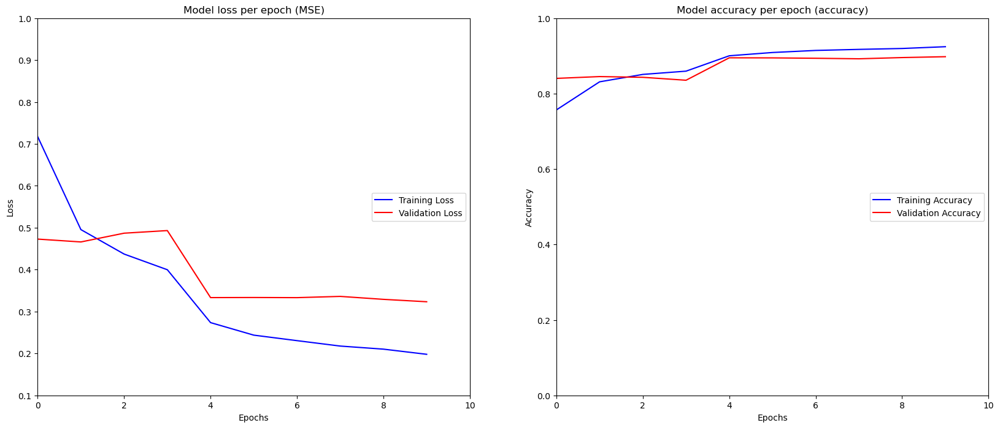

In [22]:
plt.figure(figsize = (20, 8))

plt.subplot(121)
plt.plot(train_loss_MobileNetV2, label = 'Training Loss', color = 'blue')
plt.plot(val_loss_MobileNetV2, label = 'Validation Loss', color = 'red')
plt.xlim([0, 10])
plt.ylim([0.1, 1.0])
plt.title('Model loss per epoch (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(loc='right')

plt.subplot(122)
plt.plot(train_acc_MobileNetV2, label = 'Training Accuracy', color = 'blue')
plt.plot(val_acc_MobileNetV2, label = 'Validation Accuracy', color = 'red')
plt.xlim([0, 10])
plt.ylim([0, 1.0])
plt.title('Model accuracy per epoch (accuracy)')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(loc='right')

plt.show();

### Confusion matrix  du modèle MobileNetV2

423/423 [==============================] - 86s 198ms/step


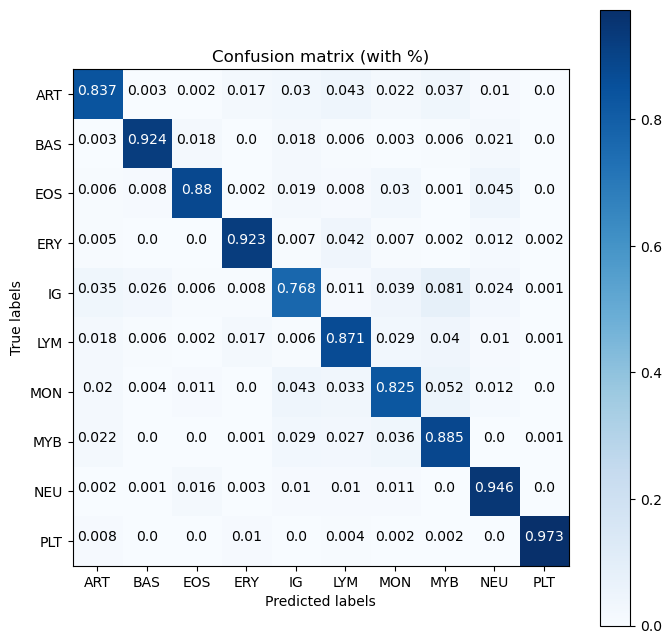

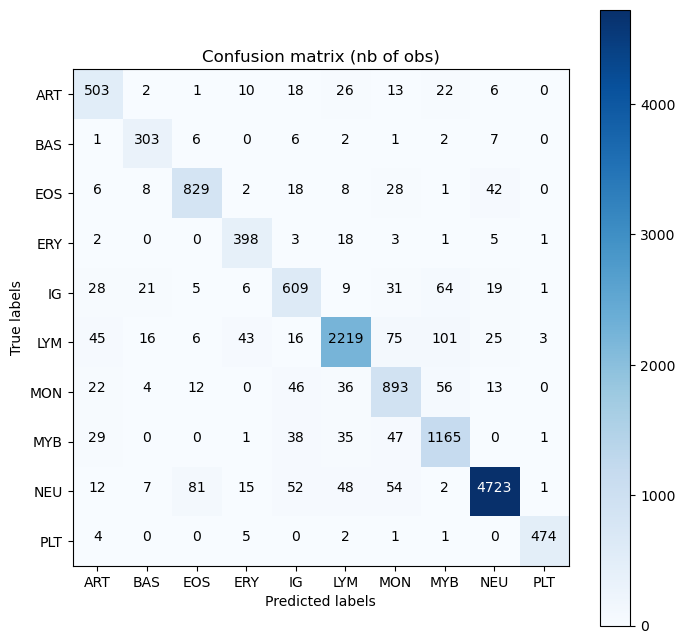

Classification Report


,precision,recall,f1-score,support
ART,0.771472,0.836938,0.802873,601.000000
BAS,0.839335,0.923780,0.879536,328.000000
EOS,0.881915,0.880042,0.880978,942.000000
ERY,0.829167,0.923434,0.873765,431.000000
IG,0.755583,0.767970,0.761726,793.000000
LYM,0.923429,0.870537,0.896204,2549.000000
MON,0.779232,0.825323,0.801616,1082.000000
MYB,0.823322,0.885258,0.853167,1316.000000
NEU,0.975826,0.945546,0.960447,4995.000000
PLT,0.985447,0.973306,0.979339,487.000000


In [23]:
## Bilan sur les données de test :
print_classification_report(testing_set, MobileNetV2_model, label_map)

In [24]:
MobileNetV2_model.evaluate(testing_set)

423/423 [==============================] - 85s 201ms/step - loss: 0.3320 - accuracy: 0.8959


[0.33196699619293213, 0.8958887457847595]

In [ ]:
#Pour charger le modèle sauvé
#saved_model = tf.keras.models.load_model('./mobilnetV2_modelv1')

In [25]:
predictions = MobileNetV2_model.predict(testing_set)
y_pred = tf.argmax(predictions, axis = 1)
df_results = pd.DataFrame(data = {"label":testing_set.classes,
                                  "label_pred":y_pred, 
                                  "img_path":test_data["image_path"]})

df_results["good_class"] = np.where(df_results["label"] == df_results["label_pred"], True, False)

423/423 [==============================] - 83s 198ms/step


1/1 [==============================] - 0s 16ms/step


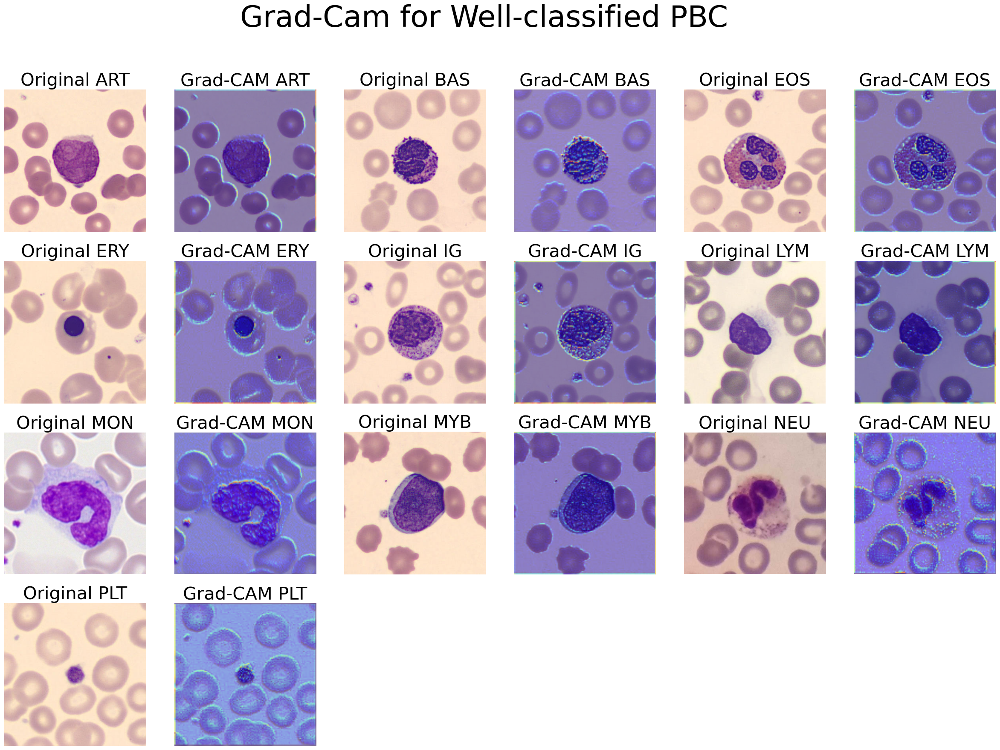

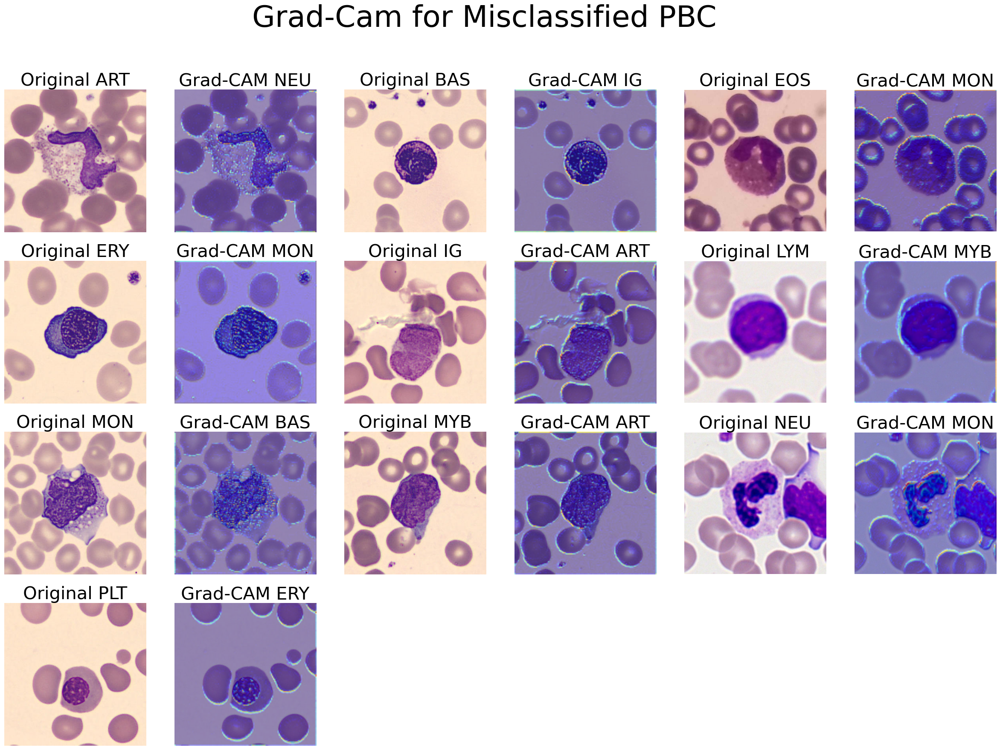

In [26]:
grad_cam_viz(df_results, MobileNetV2_model, 'mobilenet', 10, height, width, height_crop, width_crop, label_map)

## Phase de Fine tuning

In [34]:
MobileNetV2_model = load_model('./MobileNetV2_model_20MAR23-1.hdf5')

In [35]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

Number of layers in the base model:  154


In [36]:
len(MobileNetV2_model.trainable_variables)

6

In [39]:
# Model (Functional API)
height = width = 224
inputs = layers.Input(shape = (height,width,3))
x = data_preprocessing(inputs)
x = data_augmentation(x)
base_model = MobileNetV2(include_top = False,
                      weights = "imagenet",
                      input_tensor = inputs)
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.2)(x)
#x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(num_cat, activation='softmax')(x)
MobileNetV2_model = tf.keras.Model(inputs, outputs)

# Fine-tune from this layer onwards
fine_tune_at = 100

#for layer in base_model.layers[-4:]:
#    layer.trainable= True

# Freeze all the layers before the `fine_tune_at` layer
base_model.trainable = True
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [40]:
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)
MobileNetV2_model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

MobileNetV2_model.summary()

Model: "model_23"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                          

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [41]:
for layer_number, layer in enumerate(base_model.layers):
  print(layer_number, layer.name, layer.trainable)

0 input_4 False
1 Conv1 False
2 bn_Conv1 False
3 Conv1_relu False
4 expanded_conv_depthwise False
5 expanded_conv_depthwise_BN False
6 expanded_conv_depthwise_relu False
7 expanded_conv_project False
8 expanded_conv_project_BN False
9 block_1_expand False
10 block_1_expand_BN False
11 block_1_expand_relu False
12 block_1_pad False
13 block_1_depthwise False
14 block_1_depthwise_BN False
15 block_1_depthwise_relu False
16 block_1_project False
17 block_1_project_BN False
18 block_2_expand False
19 block_2_expand_BN False
20 block_2_expand_relu False
21 block_2_depthwise False
22 block_2_depthwise_BN False
23 block_2_depthwise_relu False
24 block_2_project False
25 block_2_project_BN False
26 block_2_add False
27 block_3_expand False
28 block_3_expand_BN False
29 block_3_expand_relu False
30 block_3_pad False
31 block_3_depthwise False
32 block_3_depthwise_BN False
33 block_3_depthwise_relu False
34 block_3_project False
35 block_3_project_BN False
36 block_4_expand False
37 block_4_expa

In [42]:
print(training_history_MobileNetV2.epoch[-1])

9


In [43]:
batch_size = 32
initial_epochs = 9
fine_tune_epochs = initial_epochs + 11

training_history_MobileNetV2_FT = MobileNetV2_model.fit(
                                  training_set,
                                  epochs=fine_tune_epochs,
                                  initial_epoch=training_history_MobileNetV2.epoch[-1], # start from previous last epoch
                                  steps_per_epoch = nb_img_train//batch_size,
                                  validation_data=validation_set,
                                  validation_steps = nb_img_val//batch_size,
                                  class_weight=class_weight_dict,
                                  callbacks = [TON, reduce_learning_rate, early_stopping, tensorboard]
                                  #, early_stopping,
                                  #use_multiprocessing = True
                                  )

Epoch 10/20
1352/1352 [==============================] - 532s 392ms/step - loss: 0.9114 - accuracy: 0.6935 - val_loss: 0.4943 - val_accuracy: 0.8454 - lr: 1.0000e-05
Epoch 11/20
1352/1352 [==============================] - 590s 436ms/step - loss: 0.3840 - accuracy: 0.8745 - val_loss: 0.3105 - val_accuracy: 0.9026 - lr: 1.0000e-05
Epoch 12/20
1352/1352 [==============================] - 618s 457ms/step - loss: 0.2927 - accuracy: 0.9026 - val_loss: 0.2832 - val_accuracy: 0.9085 - lr: 1.0000e-05
Epoch 13/20
1352/1352 [==============================] - 609s 451ms/step - loss: 0.2367 - accuracy: 0.9194 - val_loss: 0.2423 - val_accuracy: 0.9215 - lr: 1.0000e-05
Epoch 14/20
1352/1352 [==============================] - 564s 417ms/step - loss: 0.2048 - accuracy: 0.9287 - val_loss: 0.2241 - val_accuracy: 0.9260 - lr: 1.0000e-05
Epoch 15/20
1352/1352 [==============================] - 561s 415ms/step - loss: 0.1701 - accuracy: 0.9391 - val_loss: 0.2085 - val_accuracy: 0.9334 - lr: 1.0000e-05
Epoc

In [44]:
MobileNetV2_model.save('./MobileNetV2_model_20MAR23-1_FT.hdf5')
MobileNetV2_model.save('./MobileNetV2_model_20MAR23-1_FT.h5')
MobileNetV2_model.save_weights('./MobileNetV2_model_weights_20MAR23-1_FT.hdf5')
MobileNetV2_model.save_weights('./MobileNetV2_model_weights_20MAR23-1_FT.h5')

In [45]:
train_acc_MobileNetV2 += training_history_MobileNetV2_FT.history['accuracy']
val_acc_MobileNetV2 += training_history_MobileNetV2_FT.history['val_accuracy']
train_loss_MobileNetV2 += training_history_MobileNetV2_FT.history['loss']
val_loss_MobileNetV2 += training_history_MobileNetV2_FT.history['val_loss']

In [46]:
# Sauvegarde des objets History :
acc_MobileNetV2 = pd.concat([pd.DataFrame(train_acc_MobileNetV2), pd.DataFrame(val_acc_MobileNetV2)], axis = 1)
acc_MobileNetV2.reset_index(inplace = True)
acc_MobileNetV2.to_csv('./acc_MobileNetV2_20MAR23-1_FT.csv', index=True)

loss_MobileNetV2 = pd.concat([pd.DataFrame(train_loss_MobileNetV2),pd.DataFrame(val_loss_MobileNetV2)], axis = 1)
loss_MobileNetV2.reset_index(inplace = True)
loss_MobileNetV2.to_csv('./loss_MobileNetV2_20MAR23-1_FT.csv',index=True)

In [54]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import cm
acc_MobileNetV2 = pd.read_csv('./acc_MobileNetV2_20MAR23-1_FT.csv')
loss_MobileNetV2 = pd.read_csv('./loss_MobileNetV2_20MAR23-1_FT.csv')

In [55]:
train_acc_MobileNetV2 = acc_MobileNetV2['0']
val_acc_MobileNetV2 = acc_MobileNetV2['0.1']
train_loss_MobileNetV2 = loss_MobileNetV2['0']
val_loss_MobileNetV2 = loss_MobileNetV2['0.1']

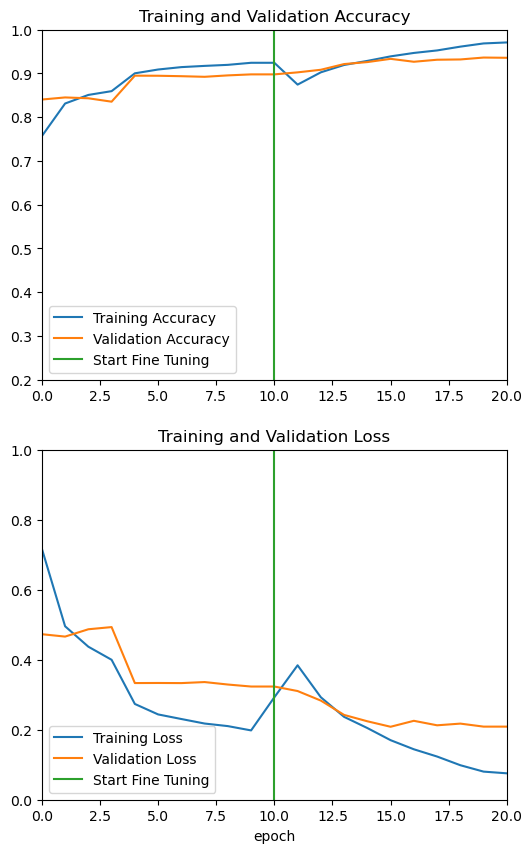

In [56]:
initial_epochs = 11
plt.figure(figsize=(6, 10))
plt.subplot(2, 1, 1)
plt.plot(train_acc_MobileNetV2, label='Training Accuracy')
plt.plot(val_acc_MobileNetV2, label='Validation Accuracy')
plt.xlim([0, 20])
plt.ylim([0.2, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower left')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(train_loss_MobileNetV2, label='Training Loss')
plt.plot(val_loss_MobileNetV2, label='Validation Loss')
plt.xlim([0, 20])
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower left')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

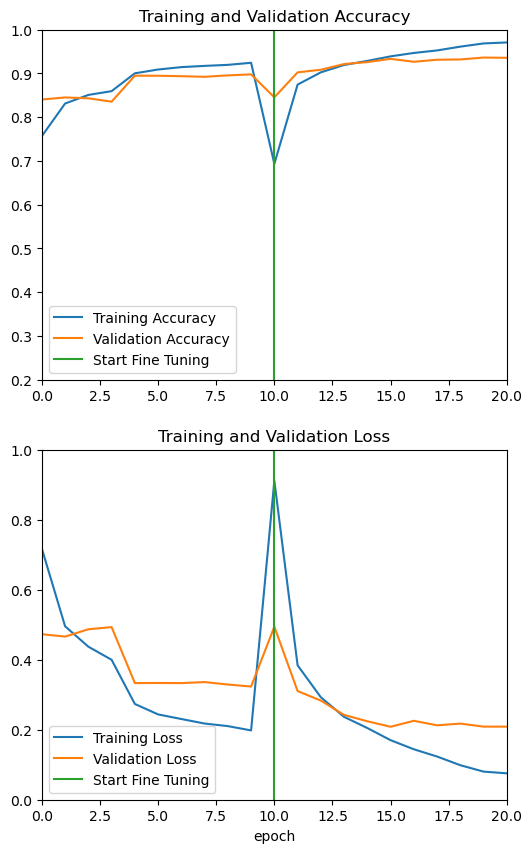

In [47]:
initial_epochs = 11
plt.figure(figsize=(6, 10))
plt.subplot(2, 1, 1)
plt.plot(train_acc_MobileNetV2, label='Training Accuracy')
plt.plot(val_acc_MobileNetV2, label='Validation Accuracy')
plt.xlim([0, 20])
plt.ylim([0.2, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower left')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(train_loss_MobileNetV2, label='Training Loss')
plt.plot(val_loss_MobileNetV2, label='Validation Loss')
plt.xlim([0, 20])
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower left')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [48]:
loss, accuracy = MobileNetV2_model.evaluate(testing_set)
print('Test accuracy :', accuracy)

423/423 [==============================] - 83s 196ms/step - loss: 0.2256 - accuracy: 0.9308
Test accuracy : 0.9307896494865417


423/423 [==============================] - 85s 200ms/step


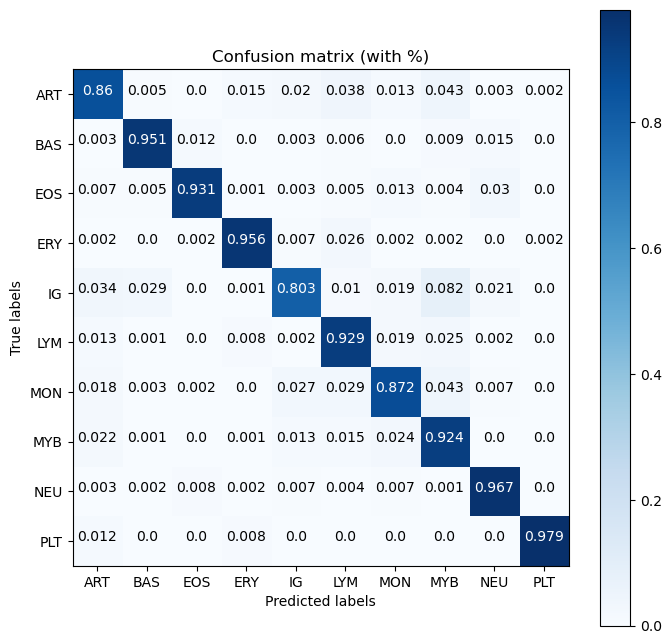

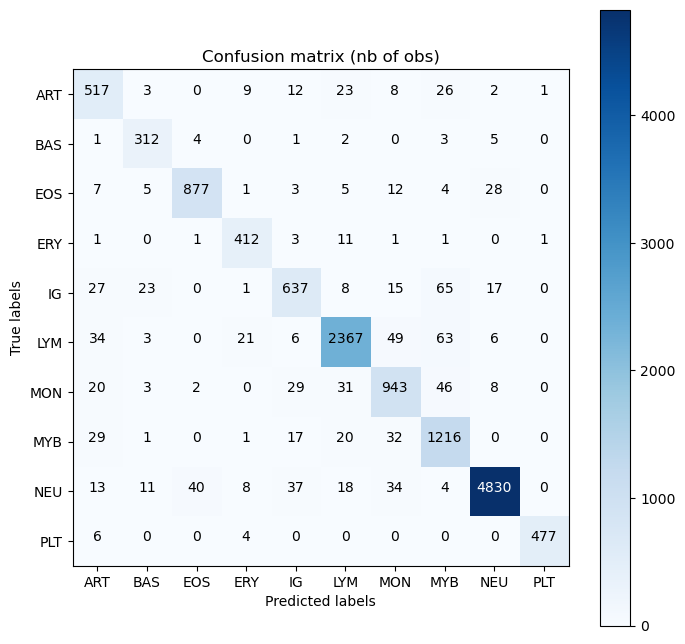

Classification Report


,precision,recall,f1-score,support
ART,0.789313,0.860233,0.823248,601.00000
BAS,0.864266,0.951220,0.905660,328.00000
EOS,0.949134,0.930998,0.939979,942.00000
ERY,0.901532,0.955916,0.927928,431.00000
IG,0.855034,0.803279,0.828349,793.00000
LYM,0.952515,0.928599,0.940405,2549.00000
MON,0.861974,0.871534,0.866728,1082.00000
MYB,0.851541,0.924012,0.886297,1316.00000
NEU,0.986520,0.966967,0.976645,4995.00000
PLT,0.995825,0.979466,0.987578,487.00000


In [49]:
## Bilan sur les données de test :
print_classification_report(testing_set, MobileNetV2_model, label_map)

In [50]:
predictions = MobileNetV2_model.predict(testing_set)
y_pred = tf.argmax(predictions, axis = 1)
df_results = pd.DataFrame(data = {"label":testing_set.classes,
                                  "label_pred":y_pred, 
                                  "img_path":test_data["image_path"]})

df_results["good_class"] = np.where(df_results["label"] == df_results["label_pred"], True, False)

423/423 [==============================] - 84s 199ms/step


In [51]:
df_results

,label,label_pred,img_path,good_class
0,8,8,C:/Users/amara/Documents/Formation_DS_DataScie...,True
1,4,4,C:/Users/amara/Documents/Formation_DS_DataScie...,True
2,8,8,C:/Users/amara/Documents/Formation_DS_DataScie...,True
3,0,0,C:/Users/amara/Documents/Formation_DS_DataScie...,True
4,8,8,C:/Users/amara/Documents/Formation_DS_DataScie...,True
...,...,...,...,...
13519,7,7,C:/Users/amara/Documents/Formation_DS_DataScie...,True
13520,8,8,C:/Users/amara/Documents/Formation_DS_DataScie...,True
13521,7,1,C:/Users/amara/Documents/Formation_DS_DataScie...,False
13522,7,7,C:/Users/amara/Documents/Formation_DS_DataScie...,True


In [52]:
df_results.to_csv(f'{data_path}/Pred_MobileNetV2_20MAR23-1_FT.csv', index=False)

### Interprétabilité: Grad-CAM algorithm

1/1 [==============================] - 0s 20ms/step


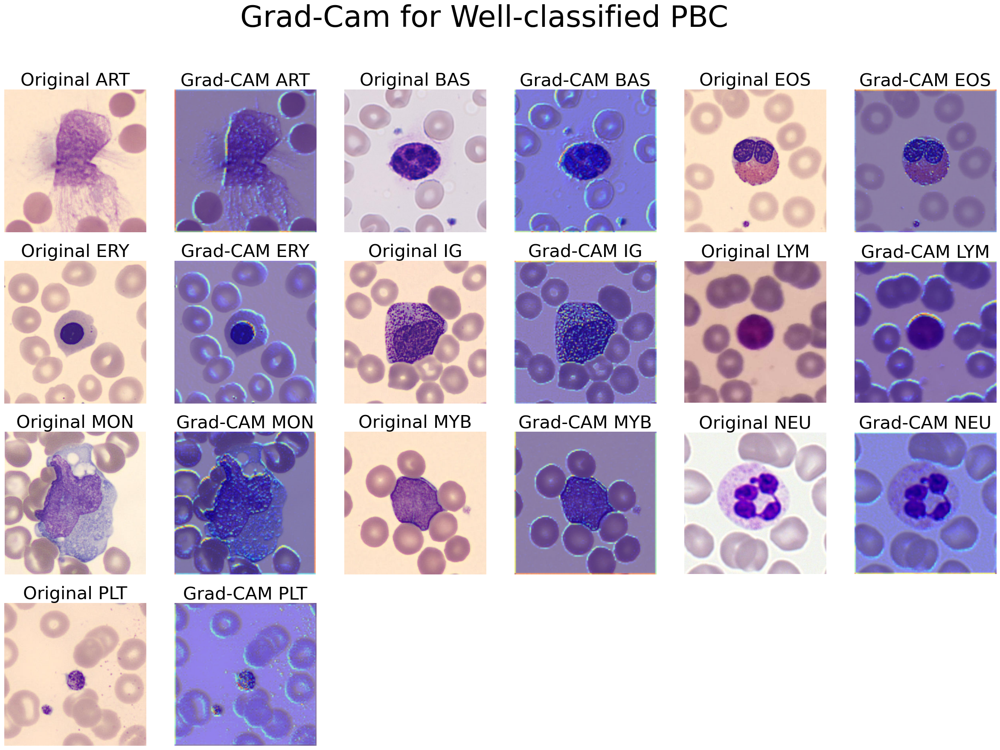

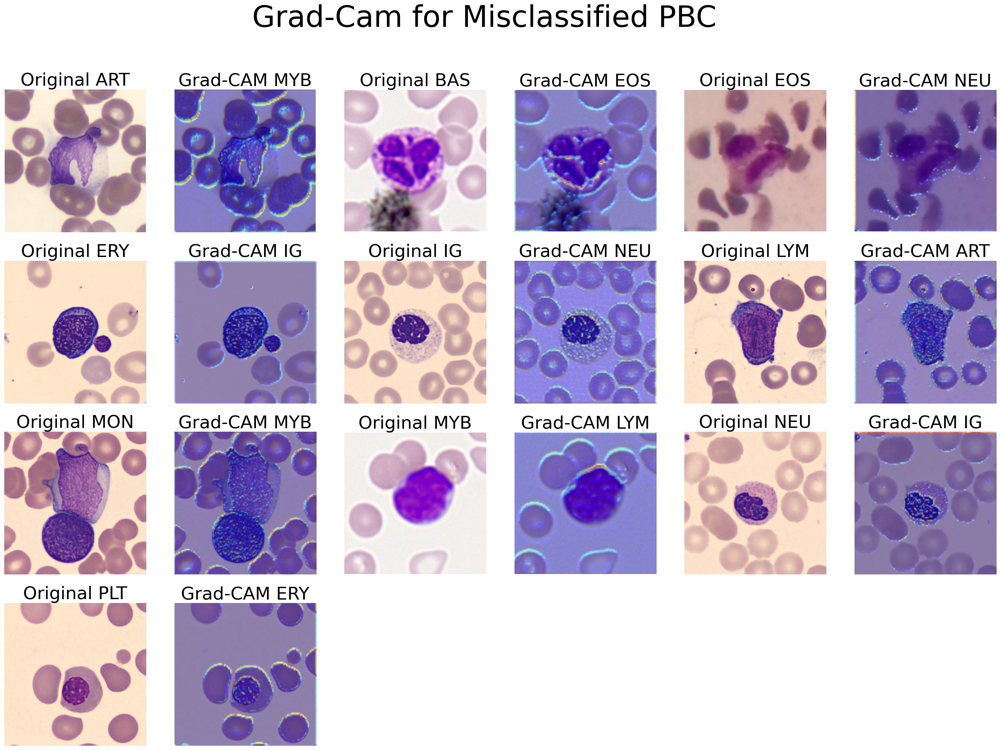

In [53]:
grad_cam_viz(df_results, MobileNetV2_model, 'mobilenet', 10, height, width, height_crop, width_crop, label_map)